In [1]:
import gzip
import glob
import pandas as pd
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from tqdm import tqdm

from astropy import units as u
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy.stats import mad_std, sigma_clipped_stats, SigmaClip, sigma_clip
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from astropy import wcs
from photutils import datasets, DAOStarFinder, SkyCircularAperture, aperture_photometry, CircularAperture, CircularAnnulus, Background2D, MedianBackground
from photutils.background import Background2D
from photutils.detection import find_peaks
from photutils.utils import calc_total_error
from astropy.visualization import ZScaleInterval
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
%matplotlib inline

In [3]:
#plt.style.use('fivethirtyeight')
#for visualization purposes
import popsims

Adding 2404 sources from /Users/caganze/research/splat//resources/Spectra/Public/SPEX-PRISM/ to spectral database
Adding 89 sources from /Users/caganze/research/splat//resources/Spectra/Public/MAGE/ to spectral database
Adding 145 sources from /Users/caganze/research/splat//resources/Spectra/Public/LRIS-RED/ to spectral database


In [4]:
#import photutils
#photutils.detection.detect_threshold

In [5]:
FIG_FOLDER='/users/caganze/research/J1624/figures/'

In [6]:
path = '/Users/caganze/research/J1624/data/2021apr20_1624-3212//'
#date = ['20130923','20150723']
rawpath = '/sci/'
calpath = '/cal/'


In [7]:
dateind = 1

flatfiles = glob.glob(path+'n00[0-2][0-9]*.fits')
darkfiles = glob.glob(path+'n00[3-4][0-9]*.fits')
rawfiles = glob.glob(path+'n01[6-8][0-9]*.fits')
#add 50 and 30
flatfiles.append(glob.glob(path+'n0030*.fits')[0])
darkfiles.append(glob.glob(path+'n0050*.fits')[0])

In [8]:
calfiles=np.concatenate([darkfiles, flatfiles])

In [9]:
rawdf = pd.DataFrame(columns=['target','filename','imgtype','filter','camera','exptime'])
for i in tqdm(range(len(rawfiles))):
    hdr = fits.open(rawfiles[i])[0].header
    rawdf.loc[i,'date'] = hdr['DATE-OBS']
    rawdf.loc[i,'UT'] = hdr['UTC']
    rawdf.loc[i,'filter'] = hdr['FWINAME']
    rawdf.loc[i,'camera'] = hdr['CAMNAME']
    rawdf.loc[i,'exptime'] = hdr['ITIME']
    rawdf.loc[i,'filename'] = rawfiles[i]
rawdf['target'] = '2126+7616'
rawdf['imgtype'] = 'sci'

caldf = pd.DataFrame(columns=['target','filename','imgtype','filter','camera','exptime'])
#for i in tqdm(range(len(flatfiles))):
for i in tqdm(range(len(calfiles))):
    hdr = fits.open(calfiles[i])[0].header
    caldf.loc[i,'date'] = hdr['DATE-OBS']
    caldf.loc[i,'UT'] = hdr['UTC']
    caldf.loc[i,'filter'] = hdr['FWINAME']
    caldf.loc[i,'camera'] = hdr['CAMNAME']
    caldf.loc[i,'lamp'] = hdr['FLIMAGIN']
    caldf.loc[i,'exptime'] = hdr['ITIME']
    caldf.loc[i,'imgtype'] = hdr['OBJECT']
    caldf.loc[i,'filename'] = calfiles[i]
caldf['target'] = '2126+7616'    

#darkdf = pd.DataFrame(columns=['target','filename','imgtype','filter','camera','exptime'])
#for i in tqdm(range(len(darkfiles))):
#    hdr = fits.open(darkfiles[i])[0].header
#    darkdf.loc[i,'date'] = hdr['DATE-OBS']
#    darkdf.loc[i,'UT'] = hdr['UTC']
#    darkdf.loc[i,'filter'] = hdr['FWINAME']
#    darkdf.loc[i,'camera'] = hdr['CAMNAME']
#    darkdf.loc[i,'lamp'] = hdr['FLIMAGIN']
#    darkdf.loc[i,'exptime'] = hdr['ITIME']
#    darkdf.loc[i,'imgtype'] = 'dark'
#    darkdf.loc[i,'filename'] = calfiles[i]
#darkdf['target'] = '2126+7616'    

100%|██████████| 51/51 [00:00<00:00, 114.67it/s]


In [10]:
obs = rawdf.append(caldf).reset_index().drop('index',1)

Hepler functions: Photometry & reduction

In [11]:
def read_img(file):
    img = fits.open(file)[0].data
    return img

def add_mask(img):
    masked = (img >= np.median(img) - 5*img.std()) & (img <= np.median(img) + 5*img.std())
    return img * masked

def make_master(files):
    #files = df['filename'].values
    stack = [read_img(f) for f in files]
    stack=[x for x in stack if len(x) >512]
   
    master = np.median(stack, axis=0)
    return master

def image_reduction(raw, flat, dark):
    #ignore darks
    #dark=0
    bias = 0
    rsci = raw - (dark - bias) - bias
    rflat = flat - (dark - bias) - bias
    fimg = rsci/rflat
    return fimg

def ap_phot(img,xc,yc,ap):
    pos = (xc,yc)
    aperture = CircularAperture(pos,r=ap)
    rin = 20
    rout = 24
    bkgap = CircularAnnulus(pos, r_in=rin, r_out=rout)
    apers = [aperture,bkgap]
    phottab = Table(aperture_photometry(img, apers, 
                                        method='exact', error=np.sqrt(img))).to_pandas()
    fsb = phottab['aperture_sum_0'].values
    fsb_er = phottab['aperture_sum_err_0'].values
    
    #fbkg = phottab['aperture_sum_1'].values
    #sflux = (fsb/aperture.area - fbkg/bkgap.area) * aperture.area
    #return fsb[0]
    return fsb[0], fsb_er[0]

def diff_phot(f1,f2):
    deltamag = -2.5*np.log10(f1/f2)
    return deltamag

def get_asep(x1,y1,x2,y2):
    asep = np.sqrt((x1-x2)**2 + (y1-y2)**2)
    return asep

def get_stacked_images(fltr):
    kfiles_sci=obs.filename[(obs['filter']==fltr) & (obs.imgtype=='sci')]
    #kfiles_dark=obs.filename[(obs['filter']==fltr) & (obs.imgtype=='dark')]
    kfiles_flat=obs.filename[(obs['filter']==fltr) & (obs.imgtype=='flat')]
    
    stacked_sci=make_master(kfiles_sci.values)
    #stacked_dark=make_master(kfiles_dark.values)
    stacked_flat=make_master(kfiles_flat.values)
    
    return {'sci': stacked_sci,\
           'flat': stacked_flat}
           #'dark': stacked_dark}


def make_a_cutout(img,  npix=100, centroid=(0, 0)):
    px0, py0=centroid

    #grab a box around it
    px1, py1 = np.array([px0, py0])-npix
    px2, py2 = np.array([px0, py0])+npix
    return img[slice(int(px1), int(px2)), slice(int(py1), int(py2))]

def find_peaks(image, threshold):
    # We are going to append the peaks we find to these two lists
    peak_x_values = [] 
    peak_y_values = []
    edgewidth = 10
    for i in range(edgewidth, image.shape[0] - edgewidth):
        for j in range(edgewidth, image.shape[1] - edgewidth):
            pixel = image[i,j]
            if(pixel < threshold):
                continue
            if(pixel > image[i+1, j] and
               pixel > image[i-1, j] and
               pixel > image[i, j+1] and
               pixel > image[i, j-1] and
               pixel > image[i-1, j-1] and
               pixel > image[i+1, j-1] and
               pixel > image[i-1, j+1] and
               pixel > image[i+1, j+1]):
                peak_x_values.append(i)
                peak_y_values.append(j)
                
    # Now that we're done appending to them, it will be easier if we turn the
    # lists into numpy arrays.
    return np.array(peak_x_values), np.array(peak_y_values)

def plot_img(img, ax, vmin=-1000, vmax=1000, cmap='cubehelix'):
    ax.pcolormesh(img, vmin=vmin, vmax=vmax, cmap=cmap)
    
def gaussian2D(radius, mu):
    return 1/(mu**2*2*np.pi)*np.exp(-0.5*((radius)/mu)**2)

def centroid(image_cutout, start_x, start_y):
    x_size, y_size = image_cutout.shape
    xx, yy = np.meshgrid(np.arange(start_x, start_x + x_size),
                         np.arange(start_y, start_y + y_size))
    x_center = np.nansum(image_cutout*xx)/np.nansum(image_cutout)
    y_center = np.nansum(image_cutout*yy)/np.nansum(image_cutout)
    return (x_center, y_center)

def reduce_all(band):
    files=obs[(obs['filter']==band)  & (obs['imgtype']=='sci')].filename.values
    res={}
    for f in files:
        img=read_img(f)
        if len(img)==512: pass
        else:
            reduced=image_reduction(img, stacked_data[band]['flat'],\
                             stacked_data[band]['dark'])
            res.update({f:reduced})
    return res
def second_moment(image_cutout, centroid_x, centroid_y, start_x, start_y):
    x_size, y_size = image_cutout.shape
    xx, yy = np.meshgrid(np.arange(start_x, start_x + x_size),
                         np.arange(start_y, start_y + y_size))
    x_width = np.sqrt(np.sum((image_cutout*(xx - centroid_x))**2))/np.sqrt(np.sum(image_cutout**2))
    y_width = np.sqrt(np.sum((image_cutout*(yy - centroid_y))**2))/np.sqrt(np.sum(image_cutout**2))
    return (x_width, y_width)

def twod_gaussian_function(x, y, x0, y0, sigmax, sigmay, a):
    """
    a= amplitude
    x0= mean x
    y0= mean y
    sigmas= std deviations
    """
    xpart=-((x-x0)**2)/sigmax**2
    ypart=-((y-y0)**2)/sigmay**2
    return a*np.exp(0.5*(xpart+ypart))

def psf_flux_gaussian(image_cutout, centroid_x, centroid_y, radius, start_x, start_y):
    
    x_size, y_size = image_cutout.shape
    xx, yy = np.meshgrid(np.arange(start_x, start_x + x_size),
                         np.arange(start_y, start_y + y_size))
    
    r = np.sqrt((xx - centroid_x)**2 + (yy - centroid_y)**2)
    psf_image = gaussian2D(r, radius)
    psf_flux = np.sum(psf_image *image_cutout)/np.sum(psf_image**2)
    return psf_flux

def run_ap_photometry(image, threshold, psf_width):
    
    convolved_image = astropy.convolution.convolve(image, astropy.convolution.Gaussian2DKernel(2.6))

    peak_xs, peak_ys = find_peaks(convolved_image, threshold)
    
    moments_x = []
    moments_y = []
    centroids_x = []
    centroids_y = []
    fluxes = []
    for peak_x, peak_y in zip(peak_xs, peak_ys):
        image_cutout = image[(peak_x - 5):(peak_x + 5), (peak_y - 5):(peak_y + 5)]
        start_x = int(peak_x - 5)
        start_y = int(peak_y - 5)

        centroid_x, centroid_y = centroid(image_cutout, peak_x, peak_y)
        centroids_x.append(centroid_x)
        centroids_y.append(centroid_y)

        moment_x, moment_y = second_moment(image_cutout, peak_x, peak_y, start_x, start_y)
        moments_x.append(moment_x)
        moments_y.append(moment_y)

        psf_flux = psf_flux_gaussian(image_cutout, centroid_x, centroid_y, psf_width, start_x, start_y)
        fluxes.append(psf_flux)
        
    return pd.DataFrame({"centroid_x": centroids_x,
                         "centroid_y": centroids_y,
                         "moment_x": moments_x,
                         "moment_y": moments_y,
                         "gaussian_flux": fluxes})
def custom_centroid_finder(cutout):
    """
    custom centroid from peak flux
    
    """
    xx, yy = np.meshgrid(np.arange(np.shape(cutout)[0]), np.arange(np.shape(cutout)[-1]))
    
    x_center = np.nansum(cutout*xx)/np.nansum(cutout)
    y_center = np.nansum(cutout*yy)/np.nansum(cutout)

    return x_center, y_center
    
def get_PA(hdr):
    img_wrt_N = np.degrees(np.arctan2(CD12, CD11))
    xoff = abs(df.loc[2,'xc2'] - df.loc[2,'xc1'])
    yoff = abs(df.loc[2,'yc2'] - df.loc[2,'yc1'])
    pa = np.arctan(xoff/yoff)*180/np.pi
    return pa 


def dao_source_finder(img, sigma=3, fwhm=20.0):
    daofind = DAOStarFinder(fwhm=fwhm, threshold=sigma*np.std(img),\
                            exclude_border=True)
    dao_df=daofind(img)
    if dao_df is not None:
        photometry_table = dao_df.to_pandas()
        return photometry_table
    else:
        print ('Sorry no source found, adjust thereshold')

In [12]:
reduced_images={}

In [13]:
%matplotlib inline

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


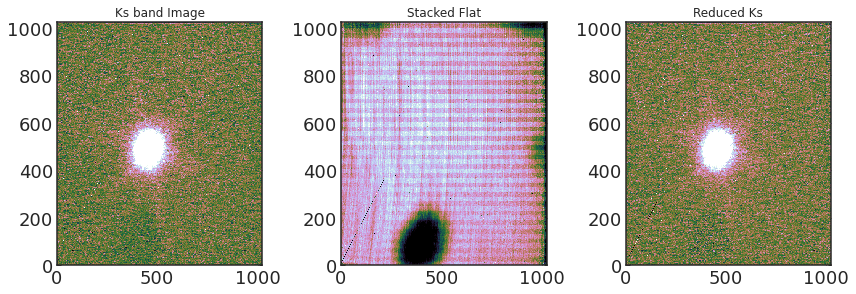

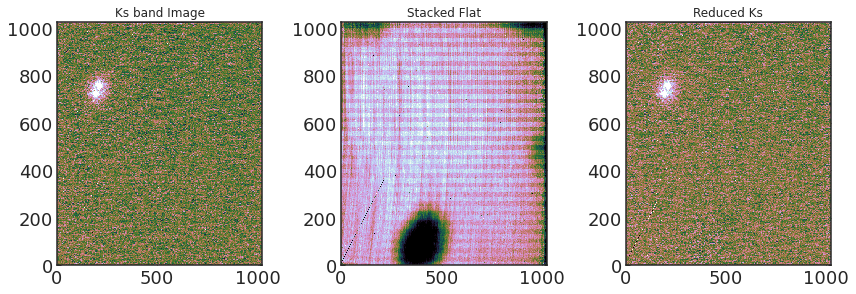

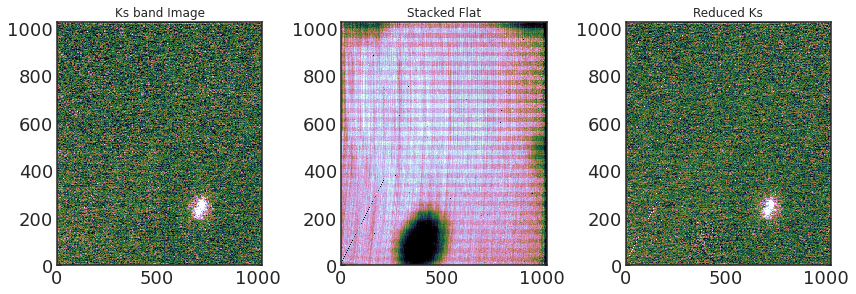

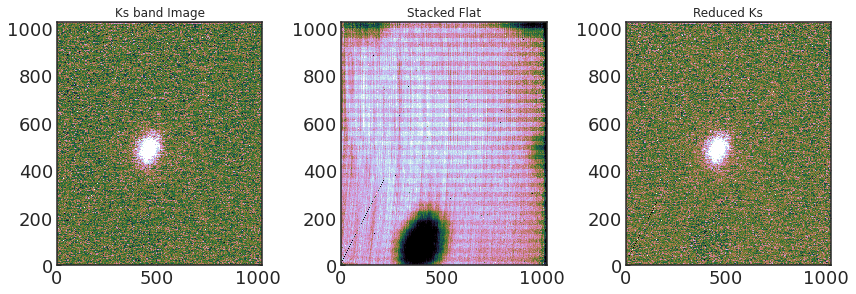

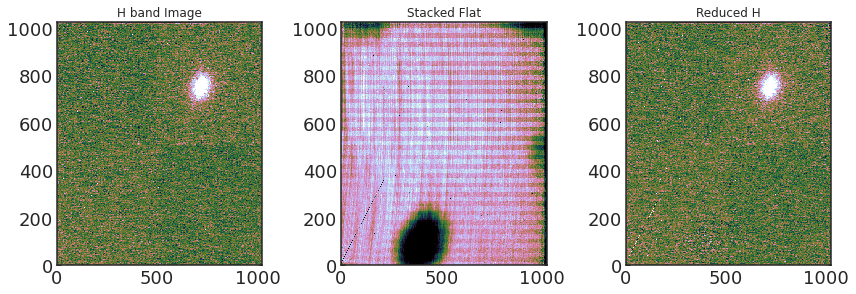

...

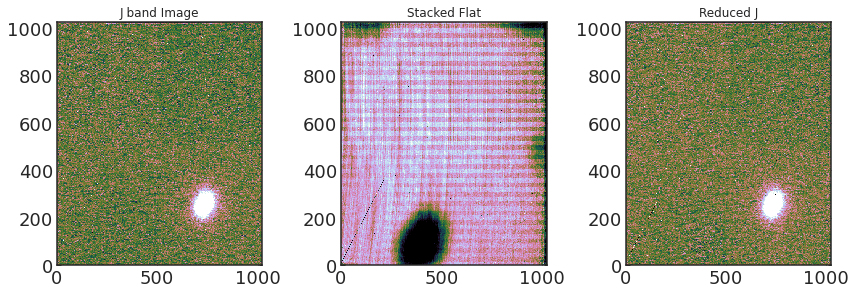

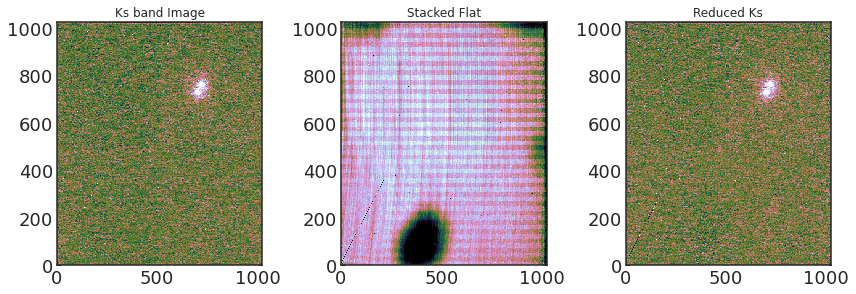

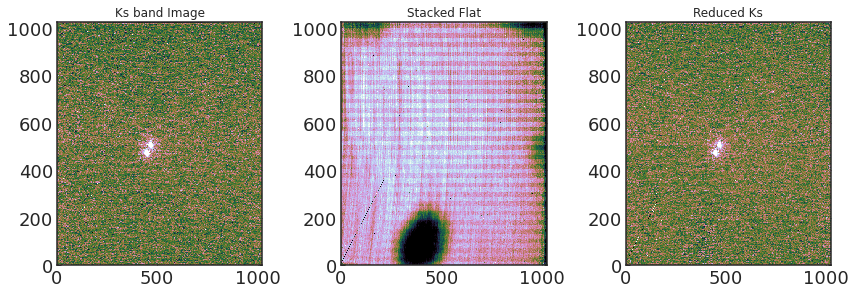

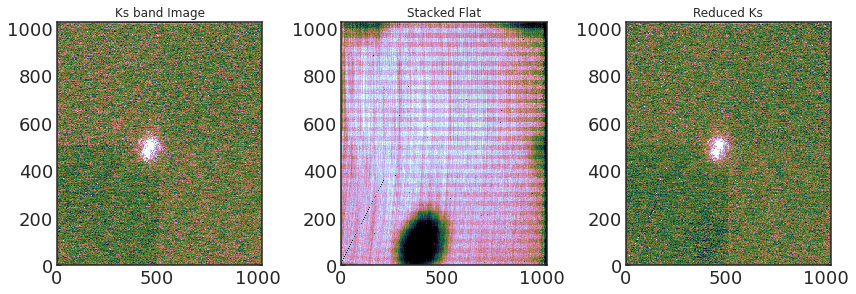

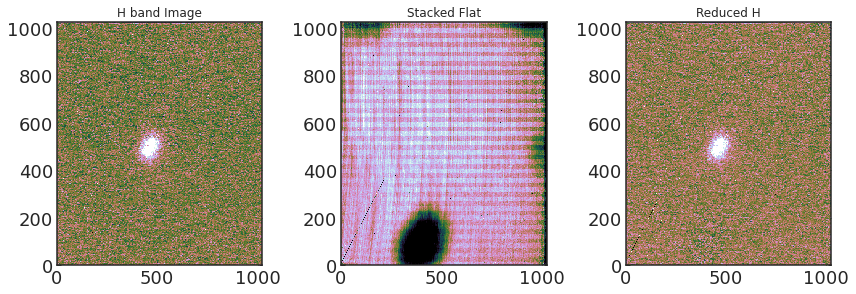

In [14]:
for _, r in (obs[obs.imgtype=='sci']).iterrows():
    stacked_flat=get_stacked_images(r['filter'])['flat']
    img=read_img(r.filename)
    reduced=image_reduction(img, stacked_flat, np.zeros_like(img))
    
    fig, ax=plt.subplots(ncols=3, figsize=(12, 4))
    vmin, vmax=ZScaleInterval().get_limits(img)
    plot_img(img, ax[0], vmin=vmin, \
             vmax=vmax, cmap='cubehelix')
    
    vmin, vmax=ZScaleInterval().get_limits(stacked_flat)
    plot_img(stacked_flat, ax[1],  vmin=vmin, \
             vmax=vmax, cmap='cubehelix')
    
    vmin, vmax=ZScaleInterval().get_limits(reduced)
    plot_img(reduced, ax[-1],  vmin=vmin, \
         vmax=vmax, cmap='cubehelix')
        
    plt.tight_layout()
    
    ax[0].set(title='{} band Image'.format(r['filter']))
    ax[1].set(title='Stacked Flat')
    ax[-1].set(title='Reduced {}'.format(r['filter']))
    
    dictio= {r.filename: {'flat': stacked_flat, 
                          'reduced': reduced, 'raw': img,\
                            'filter': r['filter']}}
    
    reduced_images.update(dictio)


    

In [15]:
#some images are not properly centerd
high_centered=['0170', '0174', '0178']
lhigh_centered=['0176', '0180', '0172']
lo_centered=['0171', '0179' ]
other=['0175']

In [16]:
plt.style.use('dark_background')

In [17]:
#pixels to extract
pixels_to_extract={'Ks':175, 'J': 175, 'H':175}

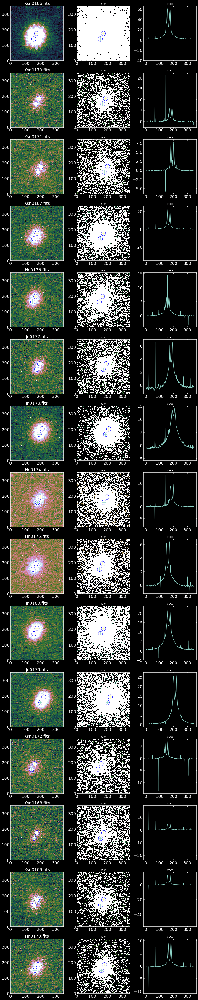

In [18]:
#find peaks with daoc
fig, axes=plt.subplots(ncols=3, figsize=(12, 4*len(reduced_images.keys())), \
                       nrows=len(reduced_images.keys()))
for k, a in zip(reduced_images.keys(), axes):
        ax, ax1, ax3=a
        rimage=reduced_images[k]['raw']
        image=reduced_images[k]['reduced']
        
        #convolve ith gaussian to find a cutout
        #convolved_image = astropy.convolution.convolve(rimage, astropy.convolution.Gaussian2DKernel(2.6))
        #cent0=centroid( convolved_image, 0, 0)
        #print (cent0)
        cent0=(500+10, 450+20)
        if  k.split('/')[-1].split('.fits')[0].split('n')[-1] in high_centered:
            cent0= (800-50, 200)
        if k.split('/')[-1].split('.fits')[0].split('n')[-1] in lhigh_centered:
            cent0=(800-50, 800-60)
            
        if k.split('/')[-1].split('.fits')[0].split('n')[-1] in lo_centered:
            cent0=(200+60, 700)
            
        if k.split('/')[-1].split('.fits')[0].split('n')[-1] in other:
            cent0=(200+50, 800-60)

        cutout=make_a_cutout(image ,  npix=pixels_to_extract[reduced_images[k]['filter']] , \
                             centroid=cent0)
        rcutout=make_a_cutout(rimage , npix=pixels_to_extract[reduced_images[k]['filter']], \
                              centroid=cent0)
        #use a slightly bigger image fhm for image 166
        fh=10.
        if k.split('/')[-1].split('.fits')[0].split('n')[-1] in ['0166', '0179']:
            fh=15.
            #df=dao_source_finder(cutout, sigma=7, fwhm=15.0)
       
        df=dao_source_finder(cutout, sigma=7, fwhm=fh)
        df['aperature_mag']=None
        df['aperature_mag_er']=None
        df['aperature_flux']=None
        df['aperature_flux_er']=None
        
        
        vmin, vmax=ZScaleInterval().get_limits(cutout)
        plot_img(cutout, ax,vmin=vmin, vmax=vmax, cmap='cubehelix')
        plot_img(rcutout, ax1, vmin=vmin, vmax=vmax, cmap='cubehelix')
        if df is not None:
            for idx, r in df.iterrows():
                ax.scatter(r.xcentroid, r.ycentroid, marker='+', s=200)
                ax1.scatter(r.xcentroid, r.ycentroid, marker='+', s=200)
                #do aperture ith 20 arsec aperture 
                df['aperature_flux'][idx]=ap_phot(cutout,r.xcentroid, r.ycentroid, 15)[0]
                df['aperature_flux_er'][idx]=ap_phot(cutout,r.xcentroid, r.ycentroid, 15)[1]
                
                df['aperature_mag'][idx]=-2.5*np.log10(df['aperature_flux'][idx])
                df['aperature_mag_er'][idx]=abs(0.434*2.5*np.log10(df['aperature_flux'][idx]))
        ax.set_title(reduced_images[k]['filter'] + k.split('/')[-1], fontsize=18)
        
        circle1 = plt.Circle((df.xcentroid[0], df.ycentroid[0]), 15, color='b', fill=False)
        circle2 = plt.Circle((df.xcentroid[1], df.ycentroid[1]), 15, color='b', fill=False)
        ax.add_patch(circle1)
        ax.add_patch(circle2)
        
        circle1 = plt.Circle((df.xcentroid[0], df.ycentroid[0]), 15, color='b', fill=False)
        circle2 = plt.Circle((df.xcentroid[1], df.ycentroid[1]), 15, color='b', fill=False)
        ax1.add_patch(circle1)
        ax1.add_patch(circle2)
        
        ax3.plot(np.nansum(cutout, axis=0))
        ax1.set(title='raw')
        ax3.set(title='trace')
        
        plt.tight_layout()
        
        sep=((df.xcentroid[1]-df.xcentroid[0])**2+\
          (df.ycentroid[1]-df.ycentroid[0])**2)**0.5
        reduced_images[k]['cutouts']=cutout
        reduced_images[k]['dao_result']=df
        reduced_images[k]['separation']=sep
        
        reduced_images[k]['deltamag_dao']=diff_phot(df.flux[0],df.flux[1])
        
        reduced_images[k]['deltamag']=abs(df.aperature_mag[0]-df.aperature_mag[1])
plt.tight_layout()
plt.savefig(FIG_FOLDER+'/ao_imagess.png', transparent=False, background='black')
        
    

In [19]:
seps= [reduced_images[k]['separation'] for k in  reduced_images.keys()]
deltmgs_dao= np.abs([reduced_images[k]['deltamag_dao'] for k in  reduced_images.keys()])
deltmgs= np.abs([reduced_images[k]['deltamag'] for k in  reduced_images.keys()])

In [20]:
print ('seperation {} +/- {} pixels'.format(np.nanmedian(seps), np.nanstd(seps)))
print ('dmag {} +/- {} mag'.format(np.nanmedian(deltmgs), np.nanstd(deltmgs)))

seperation 40.28532112163516 +/- 0.22431830107854678 pixels
dmag 0.05786352564938202 +/- 0.01338084801795002 mag


In [21]:
k

'/Users/caganze/research/J1624/data/2021apr20_1624-3212/n0173.fits'

In [22]:
rimage=reduced_images[k]['raw']
image=reduced_images[k]['reduced']

In [23]:
np.save("/Users/caganze/research/J1624/data/reduced_images_J1624.npy", reduced_images)

In [24]:
#save photometry in a file
phot_df=pd.DataFrame()

In [25]:
reduced_images[k]['deltamag']

0.055315281629331636

In [26]:
dfs=[]
for k in reduced_images.keys():
    df=reduced_images[k]['dao_result']
    fil= k.split('/')[-1].split('.fits')[0].split('n')[-1]
    df['file']=fil
    df['key']=k
    df['aperture']=15
    df['filter']= reduced_images[k]['filter']
    df['deltamag_ap']=reduced_images[k]['deltamag']
    df['deltamag_dao']=reduced_images[k]['deltamag_dao']
    dfs.append(df)
    
    
    

In [27]:
pd.concat(dfs).to_csv("/Users/caganze/research/J1624/data/nirc2_photometry_J1624.csv")

In [28]:
conct=pd.concat(dfs)

In [29]:
conct.groupby('filter').deltamag_ap.median()

filter
H     0.063550
J     0.060605
Ks    0.049587
Name: deltamag_ap, dtype: float64

In [30]:
conct.groupby('filter').deltamag_ap.std()

filter
H     0.008403
J     0.017204
Ks    0.011616
Name: deltamag_ap, dtype: float64

In [33]:
def median_combine(filt, npix=65, plot=True, center_on='first', combine='median'):
    comb_df=conct[conct['filter']==filt]
    center_idx=0
    if center_on=='second':  center_idx=1
    cutouts=[]
    for idx in tqdm(np.arange(len(comb_df))):
        img=reduced_images[conct.key.iloc[idx]]['cutouts']
        #pick the subtable and sort it on the x-axis
        subt=comb_df[comb_df.key==comb_df.key.iloc[idx]].sort_values('xcentroid')
        #print (subt)
        #only pick the center of the 2nd object 
        cent=subt.iloc[center_idx][['xcentroid', 'ycentroid']].values
        #take npix pixels (pixescale shouldn't change by f)
        cutout=make_a_cutout(img,  npix=npix, centroid=tuple(cent))
        cutouts.append(cutout)
  
    cutouts=np.array([x for x in cutouts if np.shape(x)[-1] > 0])

    median=np.nanmedian(cutouts, axis=0)
    
    if combine=='average':
         median=np.nanmean(cutouts, axis=0)
        
    if plot:
        fig, ax=plt.subplots()
        vmin, vmax=ZScaleInterval().get_limits(median)
        plot_img(median, ax, \
                      vmin=vmin, vmax=vmax, cmap='cubehelix')
    return median
        

In [34]:
med_j=median_combine('J', npix=80, plot=False, center_on='first', combine='median')
med_h=median_combine('H', npix=70, plot=False, center_on='first', combine='median')
med_k=median_combine('Ks', npix=81, plot=False, center_on='second', combine='median')

100%|██████████| 14/14 [00:00<00:00, 335.85it/s]


In [ ]:
#vmin

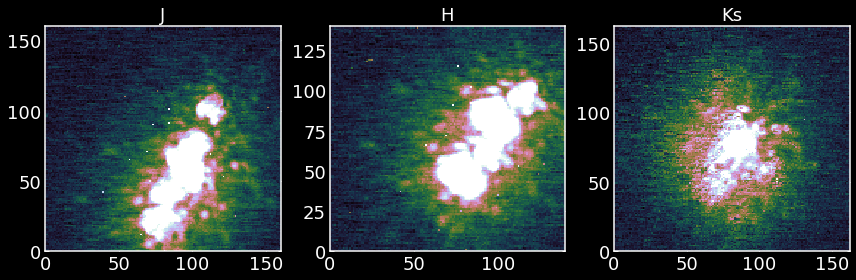

In [35]:
fig, ax=plt.subplots(ncols=3, figsize=(12, 4))
vmin, vmax=ZScaleInterval().get_limits(med_j)
plot_img(med_j, ax[0], vmin=vmin, vmax=vmax, cmap='cubehelix')
plot_img(med_h, ax[1], vmin=vmin, vmax=vmax, cmap='cubehelix')
plot_img(med_k, ax[-1], vmin=vmin, vmax=vmax, cmap='cubehelix')

ax[0].set_title('J', fontsize=18)
ax[1].set_title('H', fontsize=18)
ax[-1].set_title('Ks', fontsize=18)

plt.tight_layout()

plt.savefig(FIG_FOLDER+'/average_combined_ao_imagess.png', transparent=False, \
            background='black')





#hopefully they're all the same orientation in the same filter so just\
#center around one object


In [155]:
# Download an example FITS file, create a 2D cutout, and save it to a
# new FITS file, including the updated cutout WCS.
from astropy.io import fits
from astropy.nddata import Cutout2D
from astropy.utils.data import download_file
from astropy.wcs import WCS
from ccdproc import wcs_project
import ccdproc

def image_cutout_wcs(hdu, header, position, size):
    #create a wcs object
    wcs = WCS(hdu.header)
    
    # Make the cutout, including the WCS
    cutout = Cutout2D(hdu.data, position=position, size=size, wcs=wcs)

    # Put the cutout image in the FITS HDU
    hdu.data = cutout.data

    # Update the FITS header with the cutout WCS
    hdu.header.update(cutout.wcs.to_header())
    return hdu

def make_ccdproc_image(filename):
    #read in astropy hud
    img = ccdproc.CCDData.read(filename, unit='adu', format='fits')
    return img
#w
    
def combine_images_with_ccdproc(my_list_of_images):
    target_wcs=my_list_of_images[0].wcs
    print ( target_wcs)
    #Repeat this for each of the images you want to combine, building up a list of reprojected images
    reprojected = []
    for img in my_list_of_images:
        new_image = wcs_project(img, target_wcs)
        reprojected.append(new_image)
    #Then, combine the images as described above for any set of images:
    combiner = Combiner(reprojected)
    stacked_image = combiner.average_combine()
    return stacked_image



In [156]:
#combine r
k_band_files=obs.filename[(obs['filter']=='Ks') & (obs.imgtype=='sci')].values
k_band_images=[make_ccdproc_image(x) for x in k_band_files]


In [158]:
img=k_band_images[0]

In [166]:
wcs_helix_list = WCS(naxis=2)
wcs_helix_list.wcs.crpix = [1, 1]
wcs_helix_list.wcs.crval = [337.5202808, -20.833333059999998]
wcs_helix_list.wcs.cunit = ["deg", "deg"]
wcs_helix_list.wcs.ctype = ["RA---TAN", "DEC--TAN"]
wcs_helix_list.wcs.cdelt = [-0.0002777777778, 0.0002777777778]

In [172]:
img.header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   32 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                 1024 / length of data axis 1                          
NAXIS2  =                 1024 / length of data axis 2                          
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
BSCALE  =              1.00000 / Scaling factor                                 
BZERO   =              0.00000 / Scaling zero-point                             
OUTDIR  = '/sdata901/nirc6/2021apr20/            ' / Original directory         
ROOTNAME= 'n                 ' / File prefix                                    
FRAMENO =                  1

In [125]:
h=fits.open(k_band_files[0])[0]

In [116]:
 w=WCS(header=h.header, fobj=fits.open(k_band_files[0]))

In [121]:
h.header['RA'], h.header['DEC']

(246.06842, -32.20378)

In [122]:
w.world_to_pixel_values(h.header['RA'], h.header['DEC'])

(array(245.06842), array(-33.20378))

In [94]:
k_band_images[wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : ''  ''  
CRVAL : 0.0  0.0  
CRPIX : 0.0  0.0  
PC1_1 PC1_2  : 1.0  0.0  
PC2_1 PC2_2  : 0.0  1.0  
CDELT : 1.0  1.0  
NAXIS : 1024  1024

In [137]:
stacked= combine_images_with_ccdproc(k_band_images)

None


AttributeError: 'NoneType' object has no attribute 'is_celestial'

In [55]:
target_wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : ''  ''  
CRVAL : 0.0  0.0  
CRPIX : 0.0  0.0  
PC1_1 PC1_2  : 1.0  0.0  
PC2_1 PC2_2  : 0.0  1.0  
CDELT : 1.0  1.0  
NAXIS : 1024  1024

In [ ]:
kfiles_flat=obs.filename[(obs['filter']=='H') & (obs.imgtype=='flat')]

In [ ]:
kfiles_sci=obs.filename[(obs['filter']=='H') & (obs.imgtype=='sci')]

In [ ]:
sci_dict=reduced_images['/Users/caganze/research/J1624/data/2021apr20_1624-3212/n0176.fits']

In [ ]:
px0, py0= (800-50, 800-60)
npix=100
px1, py1 = np.array([px0, py0])-npix
px2, py2 = np.array([px0, py0])+npix
#return img

In [ ]:
flt0=read_img(kfiles_flat.iloc[0])[slice(int(px1), int(px2)), slice(int(py1), int(py2))]
flt1=read_img(kfiles_flat.iloc[1])[slice(int(px1), int(px2)), slice(int(py1), int(py2))]

In [ ]:
ratio=flt0/flt1

In [ ]:
mask=ccdproc.ccdmask(ratio, byblocks=True, ncmed=30, nlmed=30, ncsig=5, nlsig=5)

In [ ]:
#ccdproc.ccdmask?

In [ ]:
for _, r in (obs[obs.imgtype=='sci']).iterrows():
    stacked_flat=get_stacked_images(r['filter'])['flat']
    break

In [ ]:
fig, ax=plt.subplots(ncols=2, figsize=(10, 4))
vmin, vmax=ZScaleInterval().get_limits(flt0)

plot_img(flt0, ax[0],vmin=vmin, vmax=vmax, cmap='cubehelix')
plot_img(mask, ax[1],vmin=0.0, vmax=0.1, cmap='cubehelix')
ax[0].set(title='Flat')
ax[1].set(title='Mask')

In [ ]:
reduced_sliced=sci_dict['reduced'][slice(int(px1), int(px2)), slice(int(py1), int(py2))]

In [ ]:
fig, ax=plt.subplots(ncols=3, figsize=(12, 4))
vmin, vmax=ZScaleInterval().get_limits(reduced_sliced)
plot_img(reduced_sliced, ax[0],vmin=vmin, vmax=vmax, cmap='viridis')
plot_img(reduced_sliced*(1-mask), ax[1],vmin=vmin, vmax=vmax, cmap='viridis')
ax[-1].plot(np.nansum(reduced_sliced, axis=1), c='b')
ax[-1].plot(np.nansum(reduced_sliced*(1-mask)+0.01, axis=1), c='y', alpha=0.6)

plt.tight_layout()
ax[-1].set()

In [ ]:
df